In [1]:
# %matplotlib inline


# 1) Wipe out your namespace
%reset -f

# 2) Clear Jupyter’s stored outputs (and inputs if you like)
try:
    Out.clear()
except NameError:
    pass

try:
    In.clear()
except NameError:
    pass

# 3) Force Python GC
import gc
gc.collect()

# 4) Free any GPU buffers
import torch
if torch.cuda.is_available():
    torch.cuda.empty_cache()


import importlib
from libs import prep, plots, params, strategies
importlib.reload(prep)
importlib.reload(plots)
importlib.reload(params)
importlib.reload(strategies)

<module 'libs.strategies' from '/workspace/my_models/Trading/_Stock_Analysis_/libs/strategies.py'>

In [2]:
import sys
print(sys.executable)

import math
import pandas as pd
from pandas import Timestamp
pd.set_option('display.max_columns', None)

import numpy as np
import glob
import os
import json

import datetime as dt
from datetime import time
from datetime import datetime
from pprint import pprint
from collections import OrderedDict

import matplotlib.pyplot as plt
import plotly.graph_objects as go
from IPython.display import display, HTML
import seaborn as sns

from typing import Optional, Dict, Tuple, List, Sequence
from sklearn.preprocessing import StandardScaler

from tqdm.auto import tqdm
tqdm.pandas()        

pd.set_option('display.max_columns', None)


/usr/bin/python


,open,high,low,close,volume,trade_count,vwap,ask,bid,rsi_6,atr_14,adx_14,vol_spike_14,vwap_ohlc_close_session
2021-09-01 08:00:00,152.340,152.400,152.200,152.310,2052.0,79.0,152.343289,152.3405,152.2795,97.117392,0.053679,19.072892,1.023843,152.310000
2021-09-01 08:01:00,152.310,152.310,152.310,152.310,1163.0,12.0,152.310000,152.3405,152.2795,97.117392,0.049844,23.632803,0.576864,152.310000
2021-09-01 08:02:00,152.300,152.300,152.300,152.300,900.0,32.5,152.300000,152.3305,152.2695,94.266696,0.046998,27.633299,0.443475,152.307813
2021-09-01 08:03:00,152.290,152.290,152.290,152.290,637.0,53.0,152.290000,152.3205,152.2595,91.059251,0.044356,31.105532,0.311600,152.305425
2021-09-01 08:04:00,152.310,152.310,152.290,152.290,582.0,20.0,152.298281,152.3205,152.2595,91.059251,0.042616,34.396121,0.282936,152.303742
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-02-28 23:55:00,146.925,146.925,146.925,146.925,420.0,15.5,146.925000,146.9544,146.8956,41.862048,0.031785,20.469780,0.331950,147.712166
2023-02-28 23:56:00,146.890,146.890,146.890,146.890,296.0,14.0,146.890000,146.9194,146.8606,33.559533,0.032014,20.411414,0.237621,147.712162
2023-02-28 23:57:00,146.910,146.910,146.910,146.910,326.0,20.0,146.910000,146.9394,146.8806,41.513568,0.031156,19.854952,0.269923,147.712158
2023-02-28 23:58:00,146.900,146.920,146.900,146.900,7297.0,29.0,146.900371,146.9294,146.8706,38.731484,0.030359,19.338237,4.429807,147.712062


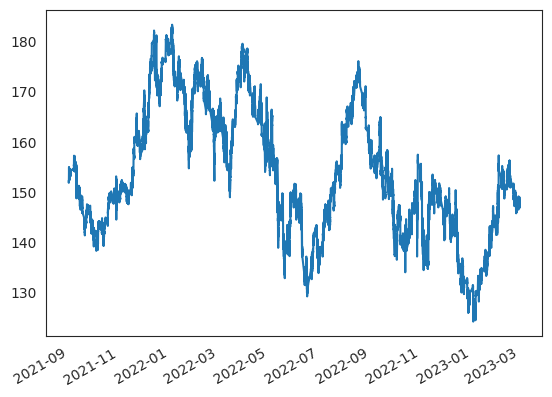

In [3]:
# loading csv with indicators unscaled

hdr = pd.read_csv(params.indunsc_csv, nrows=0).columns.tolist()
index_name = hdr[0]   # first column header, whatever it is

cols_needed = [
    "open","high","low","close","volume","trade_count","vwap","ask","bid",
    params.col_atr_tick, params.col_adx_tick, params.col_vol_spike_tick,
    params.col_rsi_tick, params.col_vwap_tick,
]

usecols = [index_name] + cols_needed

df_inds = pd.read_csv(params.indunsc_csv, usecols=usecols, index_col=index_name, parse_dates=True)
df_inds = df_inds[(df_inds.index >= '2021-09-01') & (df_inds.index < '2023-03-01')] #########################
df_inds.close.plot()
df_inds

In [4]:
print('building signals directly into df...')
df = prep.build_signal_per_day( 
        df              = df_inds, 
        min_prof_thr    = params.min_prof_thr_tick,
        max_down_prop   = params.max_down_prop_tick,
        gain_tightfact  = params.gain_tightfact_tick,
        tau_time        = params.tau_time_tick,
        tau_dur         = params.tau_dur_tick,
        thresh_mode     = params.thresh_mode_tick,
        thresh_window   = params.thresh_window_tick,
)

first_day = df.index.normalize().min()
start_ask = df.loc[df.index.normalize() == first_day, "ask"].iloc[0]
strategies.reset_globals(start_ask)

sim_results = {}
groups = df.groupby(df.index.normalize())
total_days = df.index.normalize().nunique()

col_signal = "signal_raw"
sign_thresh = "signal_thresh"

for day, df_day_sim in tqdm(groups, desc="Generate+Simulate", total=total_days):
    df_actions = strategies.generate_actions_alpaca(
        df              = df_day_sim,
        col_signal      = col_signal,
        sign_thresh     = sign_thresh,
        col_atr         = params.col_atr_tick,
        col_adx         = params.col_adx_tick,
        col_vol_spike   = params.col_vol_spike_tick,
        col_rsi         = params.col_rsi_tick,
        col_vwap        = params.col_vwap_tick,
        reset_peak      = params.reset_peak_tick,
        rsi_min_thresh  = params.rsi_min_thresh_tick,
        rsi_max_thresh  = params.rsi_max_thresh_tick,
        atr_mult        = params.atr_mult_tick,
        vwap_atr_mult   = params.vwap_atr_mult_tick,
        vol_thresh      = params.vol_thresh_tick,
        adx_thresh      = params.adx_thresh_tick,
        trailstop_pct   = params.trailstop_pct_tick,
        sess_start      = params.sess_premark,
    )

    sim_results.update(
        strategies.simulate_trading(
            day         = day,
            df          = df_actions,
            buy_factor  = params.buy_factor_tick,
            sell_factor = params.sell_factor_tick,
        )
    )

print("Loop finished. Days simulated:", len(sim_results))

building signals directly into df...


Generate+Simulate:   0%|          | 0/375 [00:00<?, ?it/s]

Loop finished. Days simulated: 375


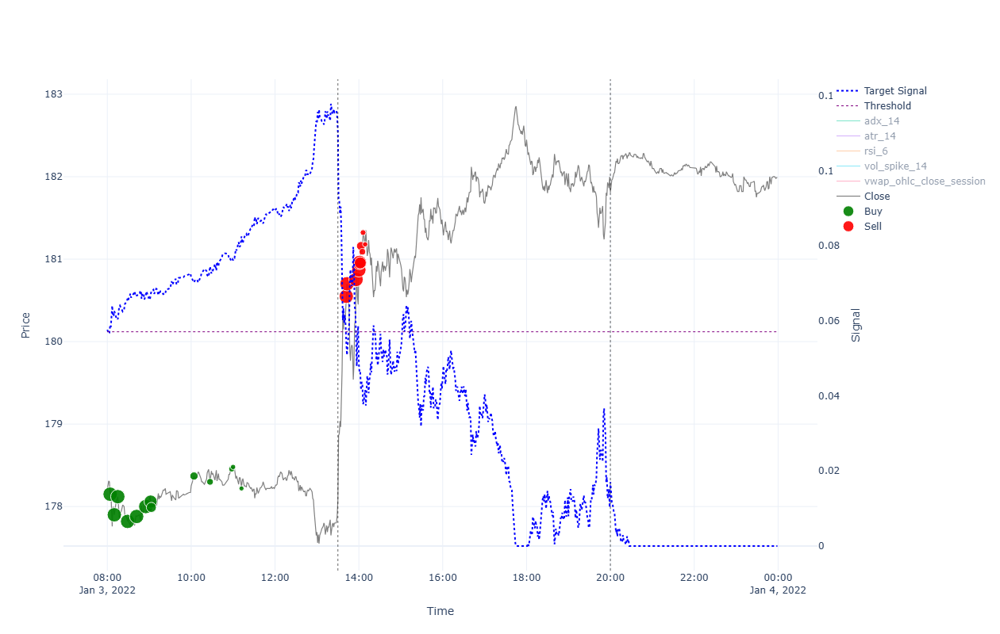


                                                  ******* Performance for 2022-01-03 *******

INTRADAY:
  shares(568); [ask_buy=178.115, fee_buy=0.004, pos_amnt_buy=101171.876]; [bid_sell=181.774, fee_sell=0.018, pos_amnt_sell=103237.083]; leftover=30.189; PNL=2065.207
TRADES:
  Tr[1]: Time(08:04)Ask(178.186)Bid(178.114)Act(Buy)Shrs(364)Pos(364); CashTr(-64861.014)=Cost(-64859.558)-Fee(-1.456); P&L(220483.748)=CashTot(155650.107)+PosAmt(64833.642)
  Tr[2]: Time(08:10)Ask(177.936)Bid(177.864)Act(Buy)Shrs(300)Pos(664); CashTr(-53381.88)=Cost(-53380.68)-Fee(-1.2); P&L(220370.188)=CashTot(102268.227)+PosAmt(118101.962)
  Tr[3]: Time(08:15)Ask(178.156)Bid(178.084)Act(Buy)Shrs(181)Pos(845); CashTr(-32246.888)=Cost(-32246.164)-Fee(-0.724); P&L(220502.657)=CashTot(70021.339)+PosAmt(150481.318)
  Tr[4]: Time(08:29)Ask(177.856)Bid(177.784)Act(Buy)Shrs(152)Pos(997); CashTr(-27034.659)=Cost(-27034.051)-Fee(-0.608); P&L(220237.727)=CashTot(42986.68)+PosAmt(177251.047)
  Tr[5]: Time(08:42)Ask(177.9

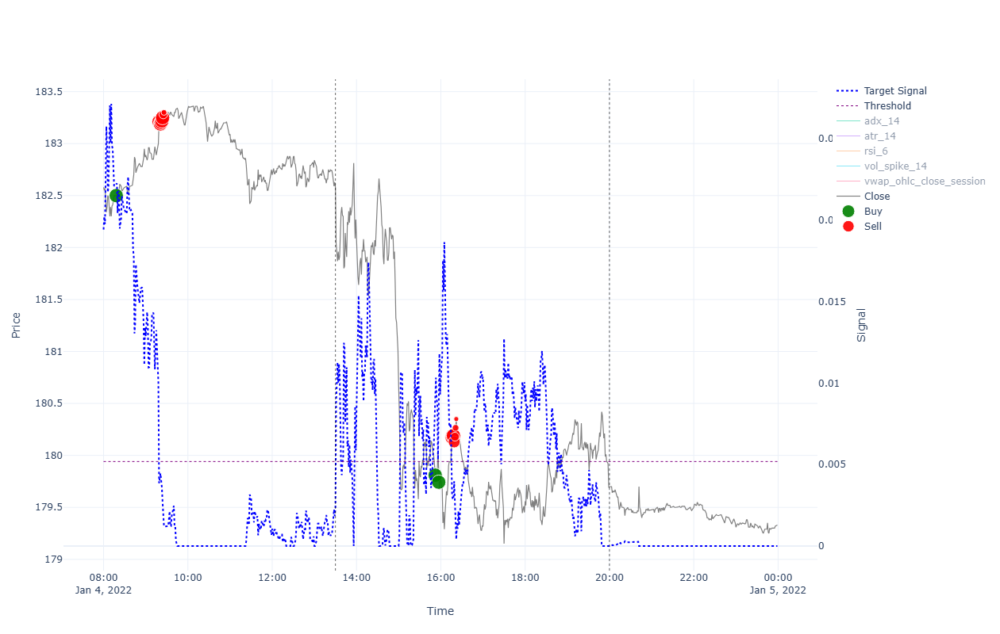


                                                  ******* Performance for 2022-01-04 *******

INTRADAY:
  shares(565); [ask_buy=182.617, fee_buy=0.004, pos_amnt_buy=103180.582]; [bid_sell=179.664, fee_sell=0.018, pos_amnt_sell=101499.977]; leftover=86.69; PNL=-1680.606
TRADES:
  Tr[1]: Time(08:18)Ask(182.536)Bid(182.464)Act(Buy)Shrs(1225)Pos(1225); CashTr(-223612.112)=Cost(-223607.212)-Fee(-4.9); P&L(223612.603)=CashTot(94.816)+PosAmt(223517.788)
  Tr[2]: Time(09:19)Ask(183.247)Bid(183.173)Act(Sell)Shrs(658)Pos(567); CashTr(120516.119)=Cost(120528.097)-Fee(-11.978); P&L(224470.253)=CashTot(120610.935)+PosAmt(103859.318)
  Tr[3]: Time(09:21)Ask(183.227)Bid(183.153)Act(Sell)Shrs(263)Pos(304); CashTr(48164.557)=Cost(48169.344)-Fee(-4.787); P&L(224454.125)=CashTot(168775.492)+PosAmt(55678.634)
  Tr[4]: Time(09:22)Ask(183.242)Bid(183.168)Act(Sell)Shrs(158)Pos(146); CashTr(28937.731)=Cost(28940.607)-Fee(-2.876); P&L(224455.809)=CashTot(197713.223)+PosAmt(26742.586)
  Tr[5]: Time(09:23)Ask(1

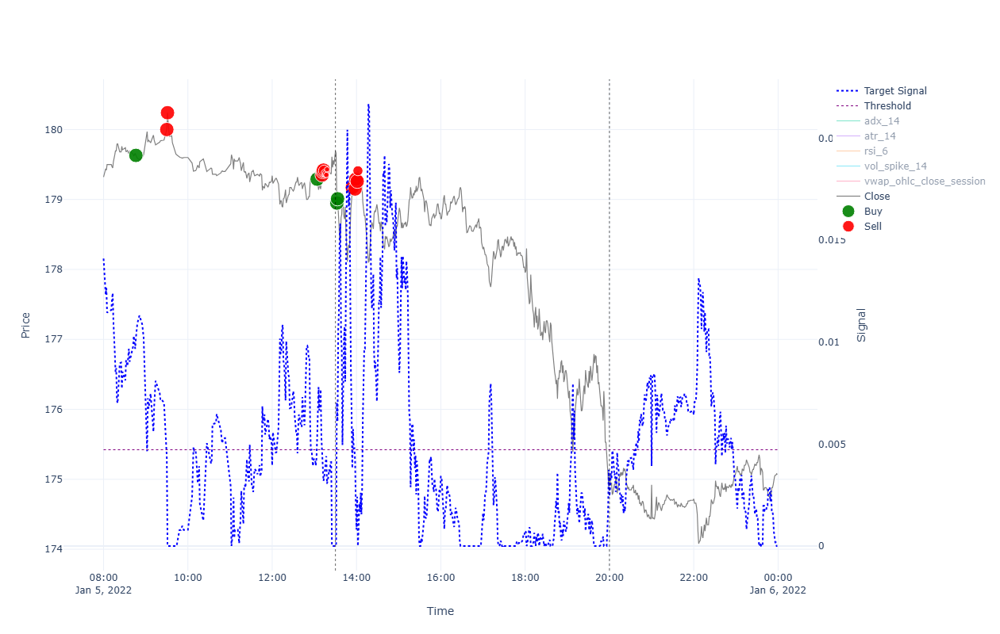


                                                  ******* Performance for 2022-01-05 *******

INTRADAY:
  shares(565); [ask_buy=179.726, fee_buy=0.004, pos_amnt_buy=101547.393]; [bid_sell=175.015, fee_sell=0.018, pos_amnt_sell=98873.295]; leftover=39.273; PNL=-2674.098
TRADES:
  Tr[1]: Time(08:46)Ask(179.666)Bid(179.594)Act(Buy)Shrs(1251)Pos(1251); CashTr(-224767.045)=Cost(-224762.041)-Fee(-5.004); P&L(224719.887)=CashTot(47.667)+PosAmt(224672.219)
  Tr[2]: Time(09:30)Ask(180.036)Bid(179.964)Act(Sell)Shrs(532)Pos(719); CashTr(95731.203)=Cost(95740.848)-Fee(-9.645); P&L(225172.986)=CashTot(95778.87)+PosAmt(129394.116)
  Tr[3]: Time(09:31)Ask(180.276)Bid(180.204)Act(Sell)Shrs(719)Pos(0); CashTr(129553.636)=Cost(129566.676)-Fee(-13.04); P&L(225332.507)=CashTot(225332.507)+PosAmt(0.0)
  Tr[4]: Time(13:04)Ask(179.326)Bid(179.254)Act(Buy)Shrs(452)Pos(452); CashTr(-81057.115)=Cost(-81055.307)-Fee(-1.808); P&L(225298.245)=CashTot(144275.392)+PosAmt(81022.853)
  Tr[5]: Time(13:11)Ask(179.386)B

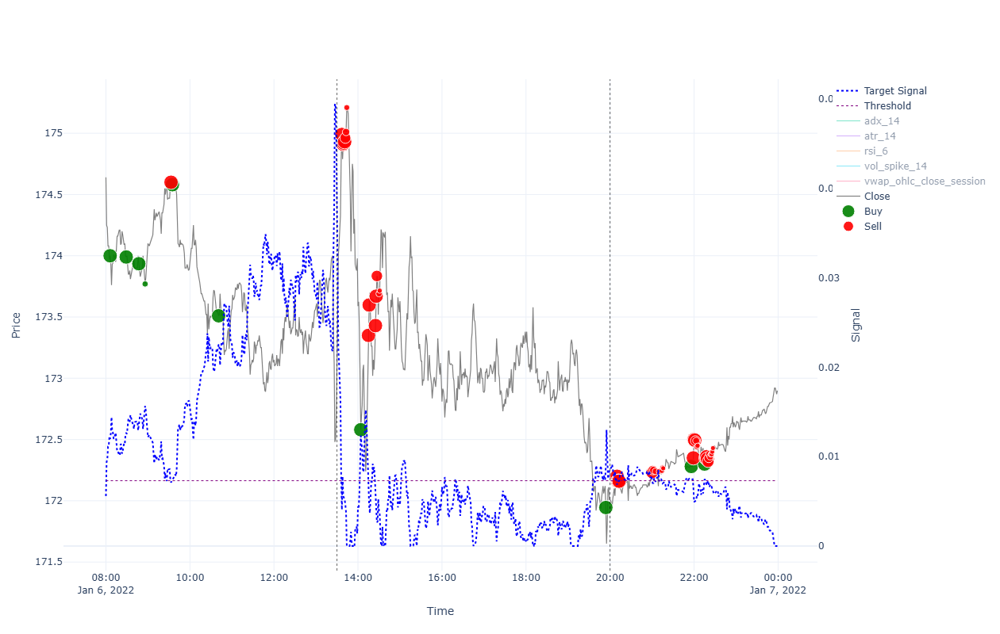


                                                  ******* Performance for 2022-01-06 *******

INTRADAY:
  shares(571); [ask_buy=173.215, fee_buy=0.004, pos_amnt_buy=98907.821]; [bid_sell=171.976, fee_sell=0.018, pos_amnt_sell=98187.82]; leftover=4.748; PNL=-720.001
TRADES:
  Tr[1]: Time(08:06)Ask(174.035)Bid(173.965)Act(Buy)Shrs(957)Pos(957); CashTr(-166555.132)=Cost(-166551.304)-Fee(-3.828); P&L(225407.468)=CashTot(58922.771)+PosAmt(166484.696)
  Tr[2]: Time(08:29)Ask(174.025)Bid(173.955)Act(Buy)Shrs(271)Pos(1228); CashTr(-47161.805)=Cost(-47160.721)-Fee(-1.084); P&L(225377.952)=CashTot(11760.967)+PosAmt(213616.986)
  Tr[3]: Time(08:47)Ask(173.97)Bid(173.9)Act(Buy)Shrs(61)Pos(1289); CashTr(-10612.402)=Cost(-10612.158)-Fee(-0.244); P&L(225305.923)=CashTot(1148.565)+PosAmt(224157.358)
  Tr[4]: Time(08:56)Ask(173.805)Bid(173.735)Act(Buy)Shrs(6)Pos(1295); CashTr(-1042.853)=Cost(-1042.829)-Fee(-0.024); P&L(225092.796)=CashTot(105.712)+PosAmt(224987.084)
  Tr[5]: Time(09:33)Ask(174.635)Bid

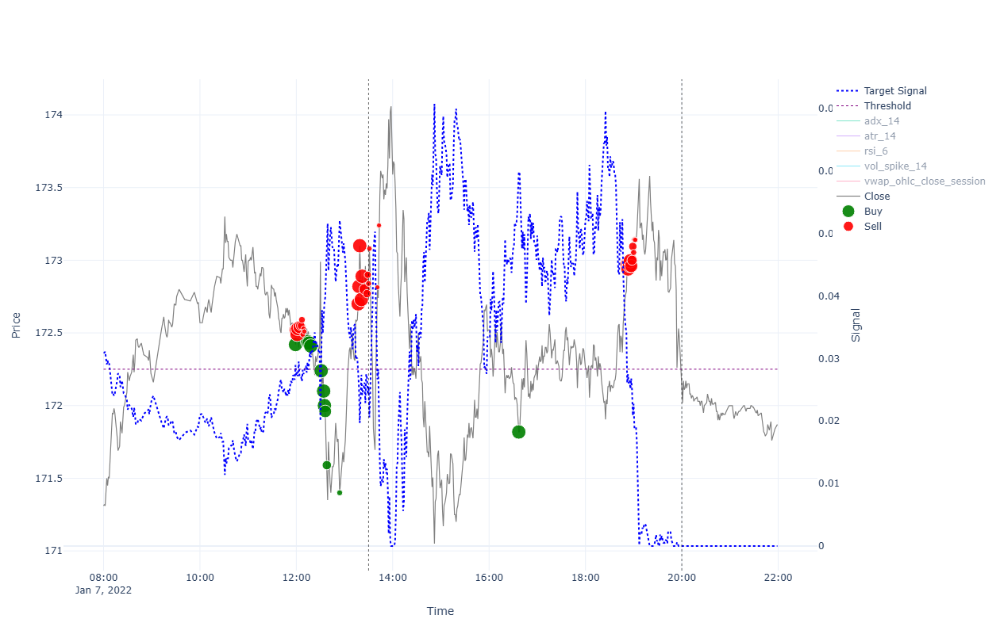


                                                  ******* Performance for 2022-01-07 *******

INTRADAY:
  shares(567); [ask_buy=172.875, fee_buy=0.004, pos_amnt_buy=98022.166]; [bid_sell=172.056, fee_sell=0.018, pos_amnt_sell=97545.348]; leftover=170.402; PNL=-476.818
TRADES:
  Tr[1]: Time(11:59)Ask(172.454)Bid(172.386)Act(Buy)Shrs(382)Pos(382); CashTr(-65879.147)=Cost(-65877.619)-Fee(-1.528); P&L(227872.378)=CashTot(162021.117)+PosAmt(65851.261)
  Tr[2]: Time(12:00)Ask(172.554)Bid(172.486)Act(Sell)Shrs(153)Pos(229); CashTr(26387.534)=Cost(26390.282)-Fee(-2.748); P&L(227907.831)=CashTot(188408.651)+PosAmt(39499.179)
  Tr[3]: Time(12:01)Ask(172.524)Bid(172.456)Act(Sell)Shrs(89)Pos(140); CashTr(15346.941)=Cost(15348.54)-Fee(-1.598); P&L(227899.362)=CashTot(203755.592)+PosAmt(24143.77)
  Tr[4]: Time(12:02)Ask(172.565)Bid(172.495)Act(Sell)Shrs(57)Pos(83); CashTr(9831.22)=Cost(9832.244)-Fee(-1.024); P&L(227903.939)=CashTot(213586.812)+PosAmt(14317.126)
  Tr[5]: Time(12:04)Ask(172.575)Bid(1

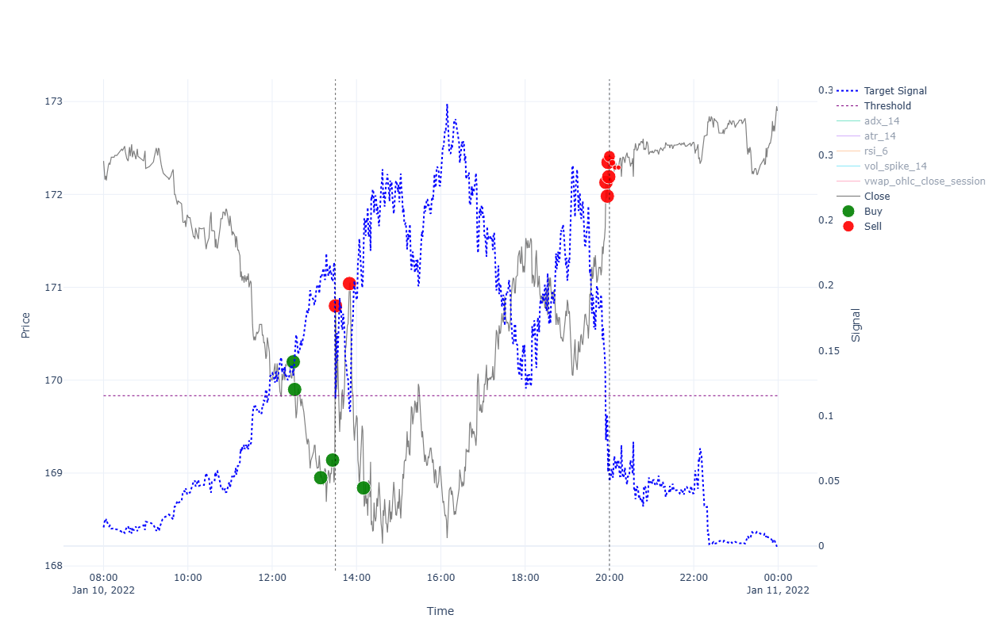


                                                  ******* Performance for 2022-01-10 *******

INTRADAY:
  shares(571); [ask_buy=170.834, fee_buy=0.004, pos_amnt_buy=97548.612]; [bid_sell=172.375, fee_sell=0.018, pos_amnt_sell=98416.157]; leftover=167.138; PNL=867.545
TRADES:
  Tr[1]: Time(12:30)Ask(170.232)Bid(170.164)Act(Buy)Shrs(499)Pos(499); CashTr(-84947.564)=Cost(-84945.568)-Fee(-1.996); P&L(229819.526)=CashTot(144907.889)+PosAmt(84911.636)
  Tr[2]: Time(12:32)Ask(169.934)Bid(169.866)Act(Buy)Shrs(397)Pos(896); CashTr(-67465.386)=Cost(-67463.798)-Fee(-1.588); P&L(229642.439)=CashTot(77442.503)+PosAmt(152199.936)
  Tr[3]: Time(13:09)Ask(168.984)Bid(168.916)Act(Buy)Shrs(391)Pos(1287); CashTr(-66074.23)=Cost(-66072.666)-Fee(-1.564); P&L(228763.423)=CashTot(11368.273)+PosAmt(217395.149)
  Tr[4]: Time(13:26)Ask(169.174)Bid(169.106)Act(Buy)Shrs(56)Pos(1343); CashTr(-9473.957)=Cost(-9473.733)-Fee(-0.224); P&L(229003.943)=CashTot(1894.317)+PosAmt(227109.627)
  Tr[5]: Time(13:30)Ask(170.83

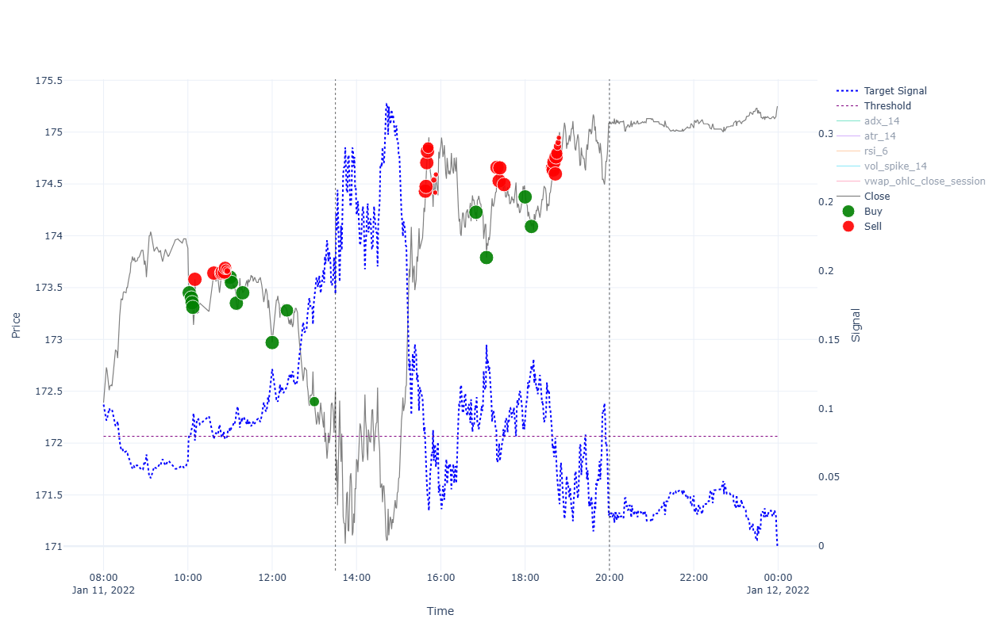


                                                  ******* Performance for 2022-01-11 *******

INTRADAY:
  shares(571); [ask_buy=172.544, fee_buy=0.004, pos_amnt_buy=98525.193]; [bid_sell=175.045, fee_sell=0.018, pos_amnt_sell=99940.407]; leftover=58.102; PNL=1415.213
TRADES:
  Tr[1]: Time(10:02)Ask(173.485)Bid(173.415)Act(Buy)Shrs(389)Pos(389); CashTr(-67487.104)=Cost(-67485.548)-Fee(-1.556); P&L(234793.443)=CashTot(167334.892)+PosAmt(67458.552)
  Tr[2]: Time(10:05)Ask(173.435)Bid(173.365)Act(Buy)Shrs(301)Pos(690); CashTr(-52205.049)=Cost(-52203.845)-Fee(-1.204); P&L(234751.9)=CashTot(115129.843)+PosAmt(119622.057)
  Tr[3]: Time(10:06)Ask(173.39)Bid(173.32)Act(Buy)Shrs(221)Pos(911); CashTr(-38320.008)=Cost(-38319.124)-Fee(-0.884); P&L(234704.629)=CashTot(76809.835)+PosAmt(157894.793)
  Tr[4]: Time(10:07)Ask(173.345)Bid(173.275)Act(Buy)Shrs(156)Pos(1067); CashTr(-27042.397)=Cost(-27041.773)-Fee(-0.624); P&L(234652.183)=CashTot(49767.438)+PosAmt(184884.745)
  Tr[5]: Time(10:10)Ask(173.6

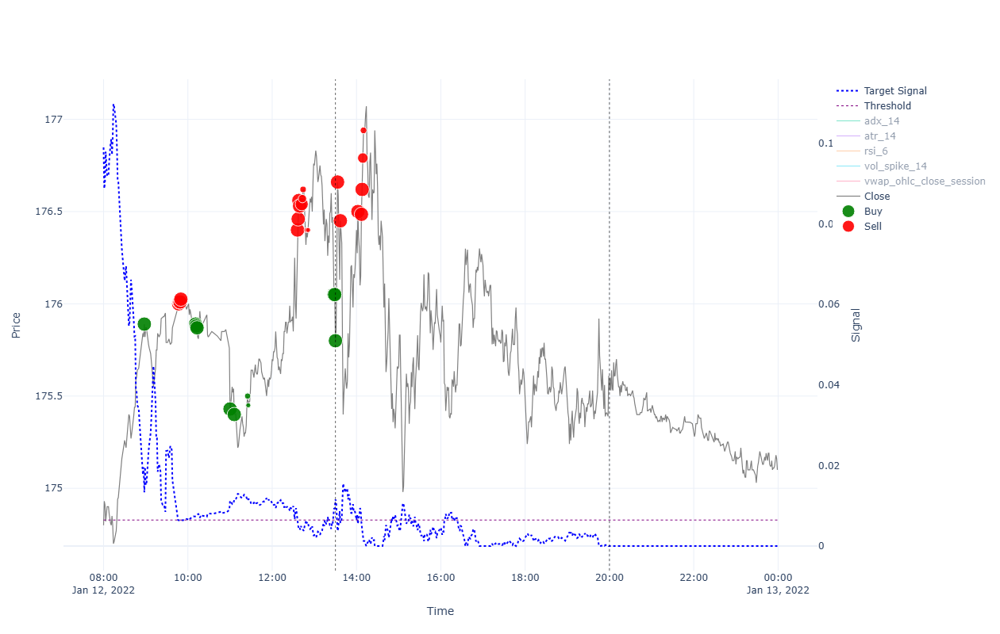


                                                  ******* Performance for 2022-01-12 *******

INTRADAY:
  shares(568); [ask_buy=175.835, fee_buy=0.004, pos_amnt_buy=99876.666]; [bid_sell=175.495, fee_sell=0.018, pos_amnt_sell=99670.863]; leftover=121.843; PNL=-205.802
TRADES:
  Tr[1]: Time(08:58)Ask(175.925)Bid(175.855)Act(Buy)Shrs(1349)Pos(1349); CashTr(-237328.491)=Cost(-237323.095)-Fee(-5.396); P&L(237281.437)=CashTot(53.312)+PosAmt(237228.125)
  Tr[2]: Time(09:47)Ask(176.035)Bid(175.965)Act(Sell)Shrs(516)Pos(833); CashTr(90788.529)=Cost(90797.837)-Fee(-9.308); P&L(237420.519)=CashTot(90841.84)+PosAmt(146578.678)
  Tr[3]: Time(09:48)Ask(176.045)Bid(175.975)Act(Sell)Shrs(323)Pos(510); CashTr(56834.034)=Cost(56839.86)-Fee(-5.827); P&L(237423.022)=CashTot(147675.874)+PosAmt(89747.148)
  Tr[4]: Time(09:49)Ask(176.045)Bid(175.975)Act(Sell)Shrs(197)Pos(313); CashTr(34663.482)=Cost(34667.036)-Fee(-3.554); P&L(237419.469)=CashTot(182339.356)+PosAmt(55080.112)
  Tr[5]: Time(09:50)Ask(176.06

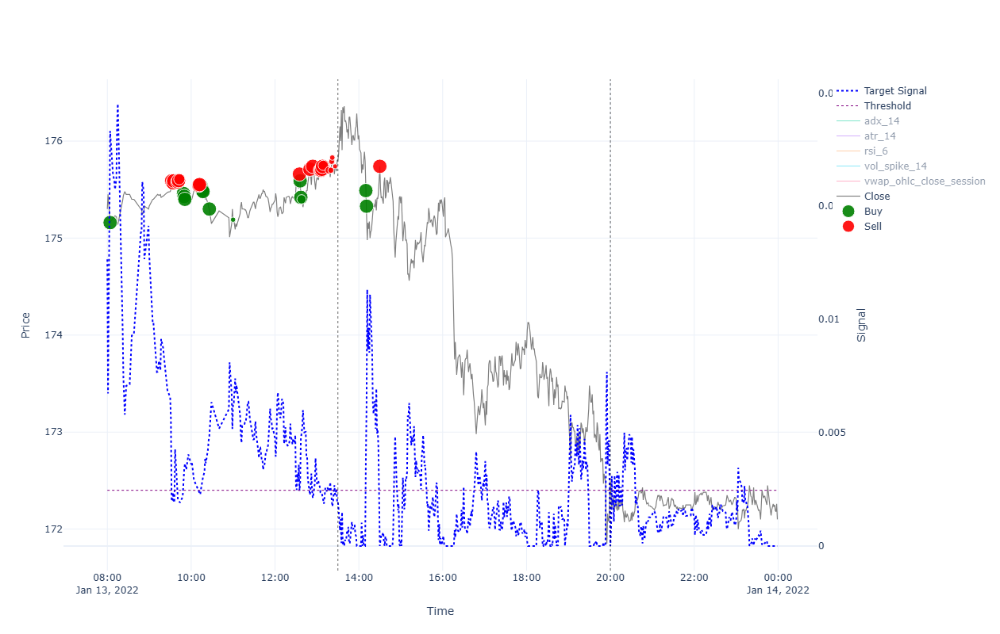


                                                  ******* Performance for 2022-01-13 *******

INTRADAY:
  shares(567); [ask_buy=175.832, fee_buy=0.004, pos_amnt_buy=99699.125]; [bid_sell=172.465, fee_sell=0.018, pos_amnt_sell=97777.756]; leftover=93.581; PNL=-1921.369
TRADES:
  Tr[1]: Time(08:04)Ask(175.195)Bid(175.125)Act(Buy)Shrs(1363)Pos(1363); CashTr(-238796.237)=Cost(-238790.785)-Fee(-5.452); P&L(238737.0)=CashTot(41.625)+PosAmt(238695.375)
  Tr[2]: Time(09:32)Ask(175.625)Bid(175.555)Act(Sell)Shrs(681)Pos(682); CashTr(119540.609)=Cost(119552.887)-Fee(-12.278); P&L(239310.676)=CashTot(119582.234)+PosAmt(119728.442)
  Tr[3]: Time(09:34)Ask(175.605)Bid(175.535)Act(Sell)Shrs(275)Pos(407); CashTr(48267.14)=Cost(48272.097)-Fee(-4.958); P&L(239292.078)=CashTot(167849.374)+PosAmt(71442.704)
  Tr[4]: Time(09:35)Ask(175.625)Bid(175.555)Act(Sell)Shrs(203)Pos(204); CashTr(35633.985)=Cost(35637.645)-Fee(-3.66); P&L(239296.558)=CashTot(203483.358)+PosAmt(35813.2)
  Tr[5]: Time(09:41)Ask(175.61

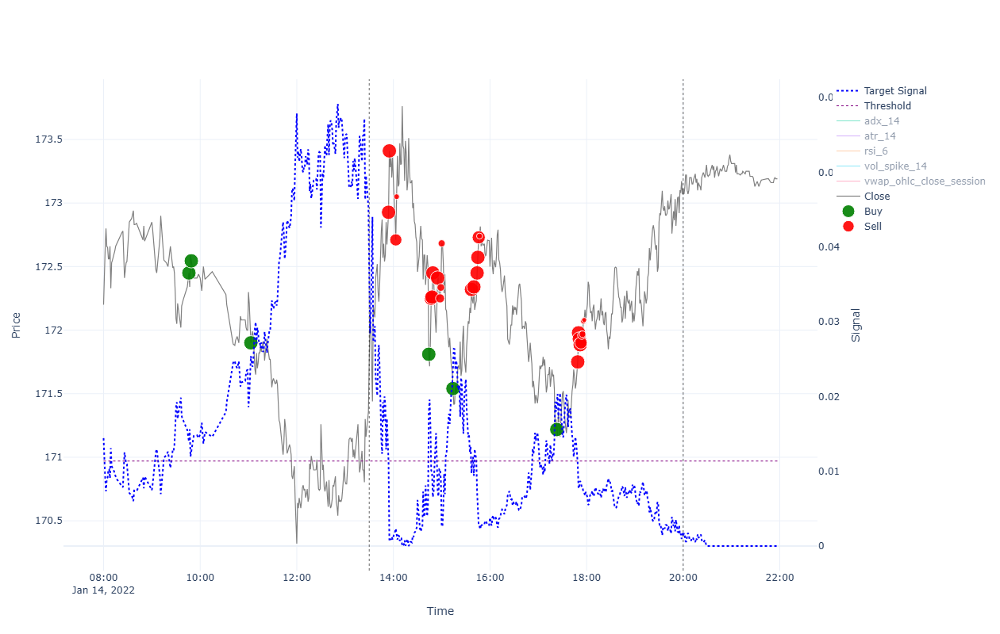


                                                  ******* Performance for 2022-01-14 *******

INTRADAY:
  shares(569); [ask_buy=171.794, fee_buy=0.004, pos_amnt_buy=97753.29]; [bid_sell=173.075, fee_sell=0.018, pos_amnt_sell=98469.676]; leftover=118.047; PNL=716.387
TRADES:
  Tr[1]: Time(09:46)Ask(172.484)Bid(172.416)Act(Buy)Shrs(610)Pos(610); CashTr(-105217.985)=Cost(-105215.545)-Fee(-2.44); P&L(239813.822)=CashTot(134640.367)+PosAmt(105173.455)
  Tr[2]: Time(09:49)Ask(172.579)Bid(172.51)Act(Buy)Shrs(277)Pos(887); CashTr(-47805.629)=Cost(-47804.521)-Fee(-1.108); P&L(239851.551)=CashTot(86834.738)+PosAmt(153016.813)
  Tr[3]: Time(11:03)Ask(171.934)Bid(171.866)Act(Buy)Shrs(505)Pos(1392); CashTr(-86828.892)=Cost(-86826.872)-Fee(-2.02); P&L(239242.761)=CashTot(5.846)+PosAmt(239236.915)
  Tr[4]: Time(13:54)Ask(172.962)Bid(172.893)Act(Sell)Shrs(538)Pos(854); CashTr(93006.606)=Cost(93016.273)-Fee(-9.667); P&L(240662.817)=CashTot(93012.451)+PosAmt(147650.366)
  Tr[5]: Time(13:55)Ask(173.445)

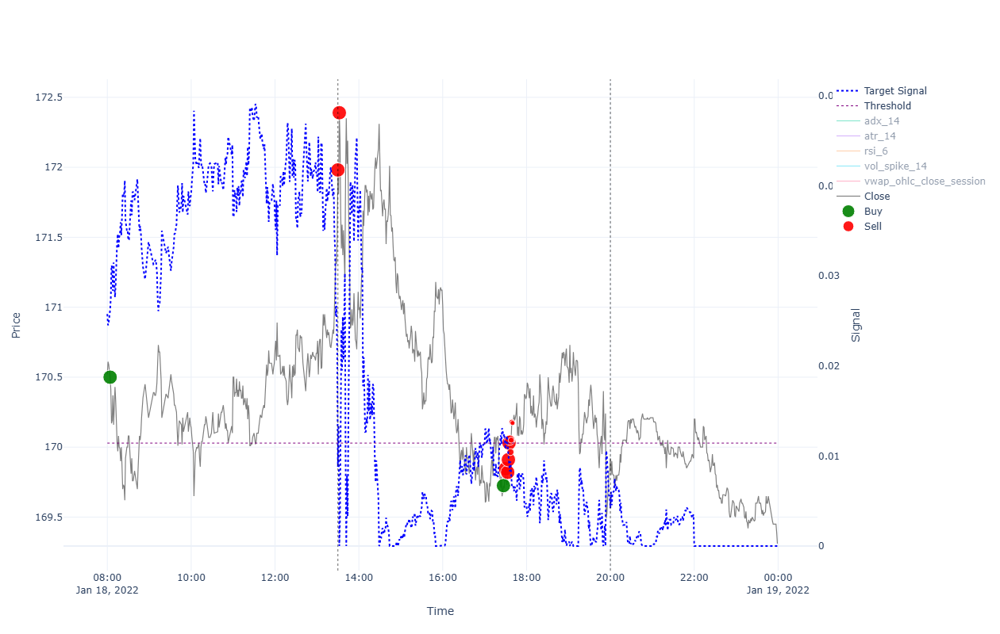


                                                  ******* Performance for 2022-01-18 *******

INTRADAY:
  shares(573); [ask_buy=172.016, fee_buy=0.004, pos_amnt_buy=98567.231]; [bid_sell=169.886, fee_sell=0.018, pos_amnt_sell=97334.422]; leftover=20.493; PNL=-1232.809
TRADES:
  Tr[1]: Time(08:04)Ask(170.534)Bid(170.466)Act(Buy)Shrs(1425)Pos(1425); CashTr(-243016.793)=Cost(-243011.092)-Fee(-5.7); P&L(243002.006)=CashTot(88.099)+PosAmt(242913.908)
  Tr[2]: Time(13:30)Ask(172.016)Bid(171.947)Act(Sell)Shrs(742)Pos(683); CashTr(127571.209)=Cost(127584.526)-Fee(-13.316); P&L(245098.972)=CashTot(127659.308)+PosAmt(117439.664)
  Tr[3]: Time(13:32)Ask(172.424)Bid(172.356)Act(Sell)Shrs(683)Pos(0); CashTr(117706.543)=Cost(117718.807)-Fee(-12.264); P&L(245365.851)=CashTot(245365.851)+PosAmt(0.0)
  Tr[4]: Time(17:27)Ask(169.759)Bid(169.691)Act(Buy)Shrs(464)Pos(464); CashTr(-78769.986)=Cost(-78768.13)-Fee(-1.856); P&L(245332.535)=CashTot(166595.865)+PosAmt(78736.67)
  Tr[5]: Time(17:30)Ask(169.879)

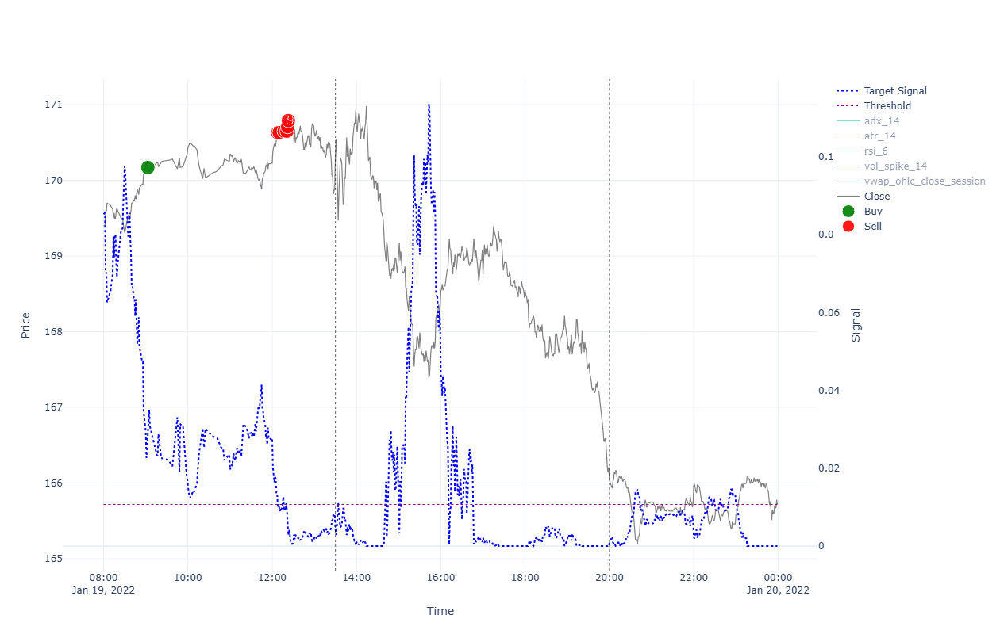


                                                  ******* Performance for 2022-01-19 *******

INTRADAY:
  shares(571); [ask_buy=170.384, fee_buy=0.004, pos_amnt_buy=97291.605]; [bid_sell=166.007, fee_sell=0.018, pos_amnt_sell=94779.713]; leftover=63.31; PNL=-2511.892
TRADES:
  Tr[1]: Time(09:03)Ask(170.204)Bid(170.136)Act(Buy)Shrs(1441)Pos(1441); CashTr(-245269.728)=Cost(-245263.964)-Fee(-5.764); P&L(245295.583)=CashTot(129.607)+PosAmt(245165.976)
  Tr[2]: Time(12:08)Ask(170.664)Bid(170.596)Act(Sell)Shrs(617)Pos(824); CashTr(105246.616)=Cost(105257.67)-Fee(-11.054); P&L(245947.245)=CashTot(105376.223)+PosAmt(140571.022)
  Tr[3]: Time(12:10)Ask(170.664)Bid(170.596)Act(Sell)Shrs(351)Pos(473); CashTr(59872.873)=Cost(59879.161)-Fee(-6.288); P&L(245940.957)=CashTot(165249.096)+PosAmt(80691.861)
  Tr[4]: Time(12:17)Ask(170.684)Bid(170.616)Act(Sell)Shrs(223)Pos(250); CashTr(38043.35)=Cost(38047.346)-Fee(-3.995); P&L(245946.421)=CashTot(203292.446)+PosAmt(42653.975)
  Tr[5]: Time(12:21)Ask(17

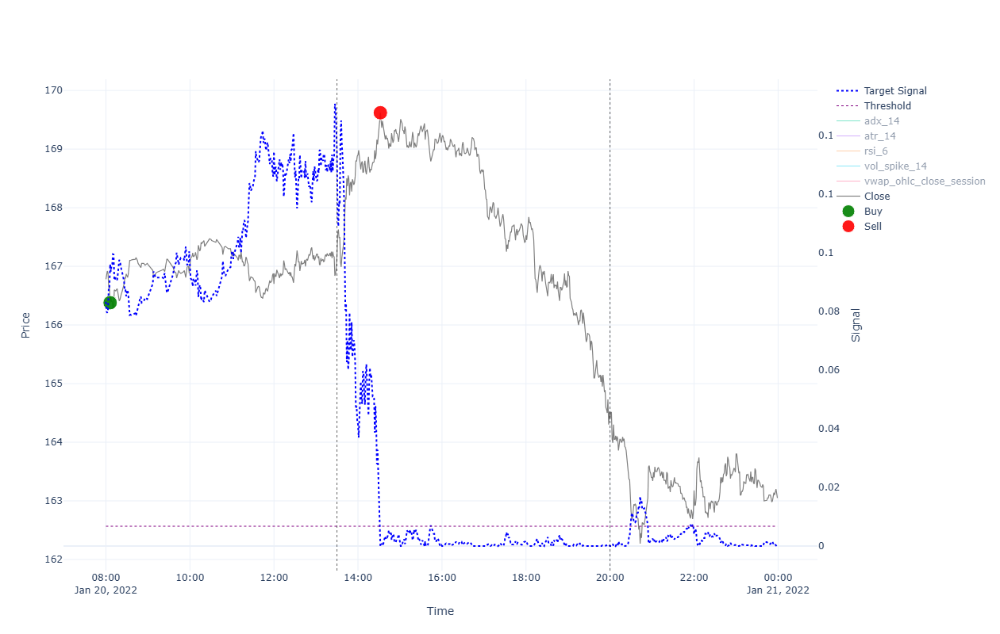


                                                  ******* Performance for 2022-01-20 *******

INTRADAY:
  shares(567); [ask_buy=167.213, fee_buy=0.004, pos_amnt_buy=94812.266]; [bid_sell=164.357, fee_sell=0.018, pos_amnt_sell=93180.399]; leftover=30.757; PNL=-1631.867
TRADES:
  Tr[1]: Time(08:06)Ask(166.413)Bid(166.347)Act(Buy)Shrs(1477)Pos(1477); CashTr(-245798.352)=Cost(-245792.444)-Fee(-5.908); P&L(245849.531)=CashTot(155.455)+PosAmt(245694.076)
  Tr[2]: Time(14:32)Ask(169.654)Bid(169.586)Act(Sell)Shrs(1477)Pos(0); CashTr(250452.242)=Cost(250478.67)-Fee(-26.427); P&L(250607.698)=CashTot(250607.698)+PosAmt(0.0)
STRATEGY:
  Δ[1]:-104.276 + Δ[2]:4758.167 PNL=4653.891
BUYNHOLD:
  shares(656); [start=167.213 end=164.357]; leftover=62.008; total_cap=107868.607; PNL=-1082.178





                                                  ******* Performance for 2022-01-21 *******

INTRADAY:
  shares(563); [ask_buy=165.383, fee_buy=0.004, pos_amnt_buy=93112.937]; [bid_sell=162.498, fee_sell=0.018, pos_amnt_sell=91476.11]; leftover=98.218; PNL=-1636.827
TRADES:
  Tr[1]: Time(08:12)Ask(162.873)Bid(162.807)Act(Buy)Shrs(1538)Pos(1538); CashTr(-250504.211)=Cost(-250498.059)-Fee(-6.152); P&L(250501.268)=CashTot(103.487)+PosAmt(250397.781)
  Tr[2]: Time(09:16)Ask(164.283)Bid(164.217)Act(Sell)Shrs(666)Pos(872); CashTr(109356.821)=Cost(109368.655)-Fee(-11.835); P&L(252657.706)=CashTot(109460.307)+PosAmt(143197.398)
  Tr[3]: Time(09:17)Ask(164.358)Bid(164.292)Act(Sell)Shrs(406)Pos(466); CashTr(66695.398)=Cost(66702.613)-Fee(-7.215); P&L(252715.847)=CashTot(176155.705)+PosAmt(76560.142)
  Tr[4]: Time(09:18)Ask(164.433)Bid(164.367)Act(Sell)Shrs(232)Pos(234); CashTr(38129.044)=Cost(38133.167)-Fee(-4.123); P&L(252746.65)=CashTot(214284.749)+PosAmt(38461.901)
  Tr[5]: Time(09:19)Ask(1


                                                  ******* Performance for 2022-01-24 *******

INTRADAY:
  shares(571); [ask_buy=160.172, fee_buy=0.004, pos_amnt_buy=91460.496]; [bid_sell=161.568, fee_sell=0.018, pos_amnt_sell=92245.045]; leftover=113.832; PNL=784.549
TRADES:
  Tr[1]: Time(13:00)Ask(159.142)Bid(159.078)Act(Buy)Shrs(687)Pos(687); CashTr(-109333.165)=Cost(-109330.417)-Fee(-2.748); P&L(255807.033)=CashTot(146520.309)+PosAmt(109286.723)
  Tr[2]: Time(13:14)Ask(159.782)Bid(159.718)Act(Sell)Shrs(265)Pos(422); CashTr(42320.588)=Cost(42325.27)-Fee(-4.682); P&L(256241.894)=CashTot(188840.898)+PosAmt(67400.996)
  Tr[3]: Time(13:15)Ask(160.022)Bid(159.958)Act(Sell)Shrs(188)Pos(234); CashTr(30068.782)=Cost(30072.104)-Fee(-3.322); P&L(256339.852)=CashTot(218909.68)+PosAmt(37430.172)
  Tr[4]: Time(13:16)Ask(159.942)Bid(159.878)Act(Sell)Shrs(100)Pos(134); CashTr(15986.033)=Cost(15987.8)-Fee(-1.767); P&L(256319.364)=CashTot(234895.712)+PosAmt(21423.652)
  Tr[5]: Time(13:17)Ask(159.982


                                                  ******* Performance for 2022-01-25 *******

INTRADAY:
  shares(580); [ask_buy=159.132, fee_buy=0.004, pos_amnt_buy=92298.764]; [bid_sell=159.868, fee_sell=0.018, pos_amnt_sell=92713.191]; leftover=60.113; PNL=414.427
TRADES:
  Tr[1]: Time(12:28)Ask(157.672)Bid(157.608)Act(Buy)Shrs(833)Pos(833); CashTr(-131343.692)=Cost(-131340.36)-Fee(-3.332); P&L(256279.445)=CashTot(124991.564)+PosAmt(131287.88)
  Tr[2]: Time(12:38)Ask(158.142)Bid(158.078)Act(Buy)Shrs(300)Pos(1133); CashTr(-47443.68)=Cost(-47442.48)-Fee(-1.2); P&L(256650.711)=CashTot(77547.884)+PosAmt(179102.827)
  Tr[3]: Time(12:52)Ask(158.462)Bid(158.398)Act(Buy)Shrs(145)Pos(1278); CashTr(-22977.527)=Cost(-22976.947)-Fee(-0.58); P&L(257003.385)=CashTot(54570.358)+PosAmt(202433.027)
  Tr[4]: Time(12:58)Ask(158.662)Bid(158.598)Act(Sell)Shrs(522)Pos(756); CashTr(82779.104)=Cost(82788.313)-Fee(-9.209); P&L(257249.777)=CashTot(137349.462)+PosAmt(119900.315)
  Tr[5]: Time(12:59)Ask(158.64


                                                  ******* Performance for 2022-01-26 *******

INTRADAY:
  shares(567); [ask_buy=163.443, fee_buy=0.004, pos_amnt_buy=92674.279]; [bid_sell=159.678, fee_sell=0.018, pos_amnt_sell=90527.466]; leftover=99.026; PNL=-2146.813
TRADES:
  Tr[1]: Time(08:56)Ask(162.933)Bid(162.867)Act(Buy)Shrs(527)Pos(527); CashTr(-85867.588)=Cost(-85865.48)-Fee(-2.108); P&L(262949.99)=CashTot(177118.87)+PosAmt(85831.12)
  Tr[2]: Time(08:58)Ask(162.973)Bid(162.907)Act(Buy)Shrs(325)Pos(852); CashTr(-52967.395)=Cost(-52966.095)-Fee(-1.3); P&L(262948.58)=CashTot(124151.475)+PosAmt(138797.105)
  Tr[3]: Time(09:00)Ask(162.983)Bid(162.917)Act(Buy)Shrs(224)Pos(1076); CashTr(-36508.998)=Cost(-36508.102)-Fee(-0.896); P&L(262941.599)=CashTot(87642.477)+PosAmt(175299.122)
  Tr[4]: Time(09:02)Ask(162.793)Bid(162.727)Act(Buy)Shrs(238)Pos(1314); CashTr(-38745.591)=Cost(-38744.639)-Fee(-0.952); P&L(262720.69)=CashTot(48896.886)+PosAmt(213823.804)
  Tr[5]: Time(09:14)Ask(163.063


                                                  ******* Performance for 2022-01-27 *******

INTRADAY:
  shares(556); [ask_buy=162.713, fee_buy=0.004, pos_amnt_buy=90470.374]; [bid_sell=158.578, fee_sell=0.018, pos_amnt_sell=88159.727]; leftover=156.118; PNL=-2310.647
TRADES:
  Tr[1]: Time(08:34)Ask(160.372)Bid(160.308)Act(Buy)Shrs(485)Pos(485); CashTr(-77782.408)=Cost(-77780.468)-Fee(-1.94); P&L(265812.164)=CashTot(188062.832)+PosAmt(77749.332)
  Tr[2]: Time(08:41)Ask(160.514)Bid(160.449)Act(Sell)Shrs(186)Pos(299); CashTr(29840.281)=Cost(29843.57)-Fee(-3.289); P&L(265877.454)=CashTot(217903.113)+PosAmt(47974.341)
  Tr[3]: Time(08:42)Ask(160.569)Bid(160.505)Act(Sell)Shrs(118)Pos(181); CashTr(18937.503)=Cost(18939.59)-Fee(-2.087); P&L(265892.021)=CashTot(236840.616)+PosAmt(29051.405)
  Tr[4]: Time(08:43)Ask(160.625)Bid(160.561)Act(Sell)Shrs(73)Pos(108); CashTr(11719.64)=Cost(11720.931)-Fee(-1.291); P&L(265900.812)=CashTot(248560.256)+PosAmt(17340.556)
  Tr[5]: Time(08:44)Ask(160.681)B


                                                  ******* Performance for 2022-01-28 *******

INTRADAY:
  shares(531); [ask_buy=166.258, fee_buy=0.004, pos_amnt_buy=88285.228]; [bid_sell=170.116, fee_sell=0.018, pos_amnt_sell=90322.089]; leftover=30.617; PNL=2036.86
TRADES:
  Tr[1]: Time(11:04)Ask(165.623)Bid(165.557)Act(Buy)Shrs(505)Pos(505); CashTr(-83641.686)=Cost(-83639.666)-Fee(-2.02); P&L(278823.334)=CashTot(195217.099)+PosAmt(83606.235)
  Tr[2]: Time(11:19)Ask(164.583)Bid(164.517)Act(Buy)Shrs(575)Pos(1080); CashTr(-94637.467)=Cost(-94635.167)-Fee(-2.3); P&L(278258.1)=CashTot(100579.632)+PosAmt(177678.468)
  Tr[3]: Time(11:41)Ask(163.383)Bid(163.317)Act(Buy)Shrs(444)Pos(1524); CashTr(-72543.695)=Cost(-72541.919)-Fee(-1.776); P&L(276931.502)=CashTot(28035.937)+PosAmt(248895.565)
  Tr[4]: Time(12:00)Ask(163.173)Bid(163.107)Act(Buy)Shrs(137)Pos(1661); CashTr(-22355.194)=Cost(-22354.646)-Fee(-0.548); P&L(276602.134)=CashTot(5680.743)+PosAmt(270921.391)
  Tr[5]: Time(12:32)Ask(163.80


                                                  ******* Performance for 2022-01-31 *******

INTRADAY:
  shares(528); [ask_buy=170.934, fee_buy=0.004, pos_amnt_buy=90255.37]; [bid_sell=174.745, fee_sell=0.018, pos_amnt_sell=92255.85]; leftover=97.336; PNL=2000.481
TRADES:
  Tr[1]: Time(08:06)Ask(171.764)Bid(171.696)Act(Buy)Shrs(535)Pos(535); CashTr(-91896.04)=Cost(-91893.9)-Fee(-2.14); P&L(286783.14)=CashTot(194925.94)+PosAmt(91857.199)
  Tr[2]: Time(08:13)Ask(171.944)Bid(171.876)Act(Sell)Shrs(211)Pos(324); CashTr(36261.965)=Cost(36265.752)-Fee(-3.786); P&L(286875.6)=CashTot(231187.905)+PosAmt(55687.694)
  Tr[3]: Time(08:22)Ask(171.534)Bid(171.466)Act(Buy)Shrs(601)Pos(925); CashTr(-103094.518)=Cost(-103092.114)-Fee(-2.404); P&L(286699.159)=CashTot(128093.387)+PosAmt(158605.772)
  Tr[4]: Time(09:05)Ask(171.604)Bid(171.536)Act(Buy)Shrs(365)Pos(1290); CashTr(-62637.029)=Cost(-62635.569)-Fee(-1.46); P&L(286737.41)=CashTot(65456.357)+PosAmt(221281.053)
  Tr[5]: Time(09:06)Ask(171.444)Bid(

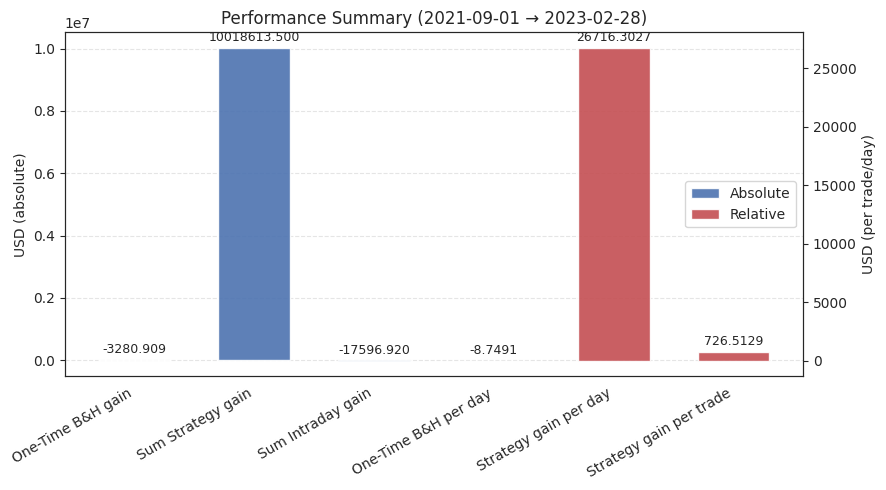

Rolling monthly summary (each metric carries its own capital forward):

Monthly Summary 2021-09 (2021-09-01 = 152.340 → 2021-09-30 = 141.732)
Num. trading days: 21  Trades Count: 632
One-Time B&H gain: -7104.511 | start: 100000.000 | final: 92895.489 | PnL%: -7.10%
Sum Strategy gain: 15620.509 | start: 100000.000 | final: 115620.509 | PnL%: 15.62%
Sum Intraday gain: -11218.248 | start: 100000.000 | final: 88781.752 | PnL%: -11.22%

Monthly Summary 2021-10 (2021-10-01 = 141.732 → 2021-10-29 = 149.870)
Num. trading days: 21  Trades Count: 666
One-Time B&H gain: 5404.200 | start: 92895.489 | final: 98299.689 | PnL%: 5.82%
Sum Strategy gain: 23790.405 | start: 115620.509 | final: 139410.914 | PnL%: 20.58%
Sum Intraday gain: 5044.927 | start: 88781.752 | final: 93826.679 | PnL%: 5.68%

Monthly Summary 2021-11 (2021-11-01 = 149.870 → 2021-11-30 = 166.317)
Num. trading days: 21  Trades Count: 614
One-Time B&H gain: 10303.492 | start: 98299.689 | final: 108603.181 | PnL%: 10.48%
Sum Strategy g

In [7]:
# importlib.reload(strategies)

year, month = map(int, params.month_to_check.split("-"))
dates_in_month = [date for date in sim_results if date.year == year and date.month == month]

if not dates_in_month:
    print(f"No simulation data for {params.month_to_check}")
else:
    for date in sorted(dates_in_month):
        df_at_date_plot, trades_at_date, stats_at_date = sim_results[date]
        plots.plot_trades(
            df                 = df_at_date_plot,
            col_signal1        = col_signal,
            sign_thresh        = sign_thresh, 
            features           = [params.col_atr_tick, params.col_adx_tick, params.col_vol_spike_tick, params.col_rsi_tick, params.col_vwap_tick],
            axis_sig_thresh    = 'second',
            # autoscale          = False,
        )
        
        print(f"\n{' ' * 50}******* Performance for {date.strftime('%Y-%m-%d')} *******\n")
        for k,v in stats_at_date.items(): # Print stats dict for each date nicely
            print(f"{k}:\n" + "\n".join("  "+L for L in (v if isinstance(v,list) else str(v).splitlines())))
        print("\n" + "="*160 + "\n")

# final visualizations and monthly aggregations
strategies.aggregate_performance(df = df_inds,
                                 sim_results = sim_results)


In [ ]:
# Save the full-run signals CSV
print(f"\nSaving full-run signals to {params.sign_csv} …")
to_csv_with_progress(df_sim, params.sign_csv)
print("CSV saved.")